## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Import Packages

In [86]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
import sys, os
%matplotlib inline

## Camera Calibration

In [87]:
global show_debug_info
show_debug_info = True

nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

calib_file_name = 'calib_file.p'


# Define conversions in x and y from pixels space to meters
# unit conversion estimated from image './test_images/unit_conversion.jpg'
ym_per_pix = 3. / 69 # meters per pixel in y dimension
xm_per_pix = 3.7 / 253 # meters per pixel in x dimension

M = []
M_inv = []

./camera_cal/calibration7.jpg
./camera_cal/calibration3.jpg
./camera_cal/calibration10.jpg
./camera_cal/calibration2.jpg
./camera_cal/calibration17.jpg
./camera_cal/calibration20.jpg
./camera_cal/calibration12.jpg
./camera_cal/calibration18.jpg
./camera_cal/calibration4.jpg
./camera_cal/calibration13.jpg
./camera_cal/calibration16.jpg
./camera_cal/calibration11.jpg
./camera_cal/calibration15.jpg
./camera_cal/calibration6.jpg
./camera_cal/calibration8.jpg
./camera_cal/calibration5.jpg
./camera_cal/calibration9.jpg
./camera_cal/calibration1.jpg
./camera_cal/calibration14.jpg
./camera_cal/calibration19.jpg


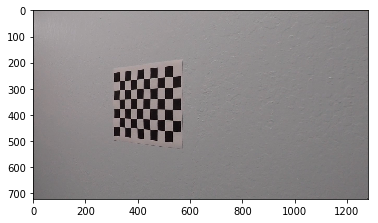

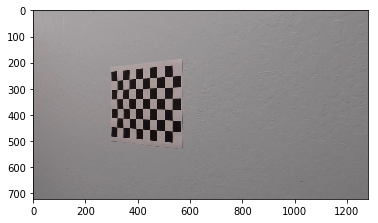

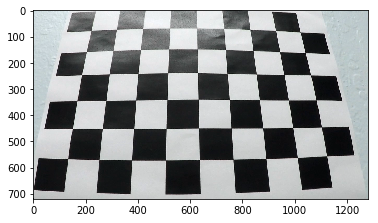

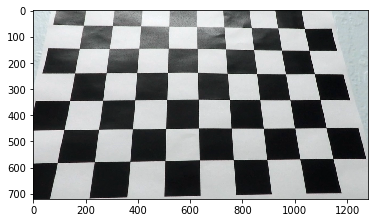

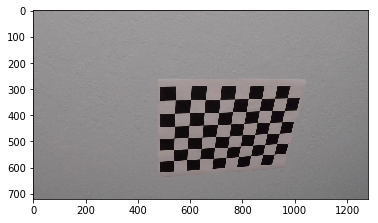

...

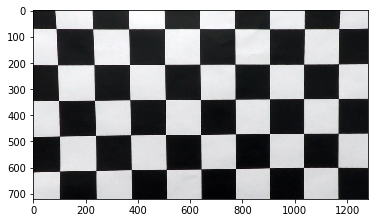

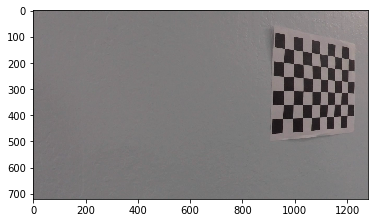

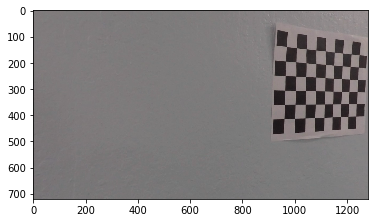

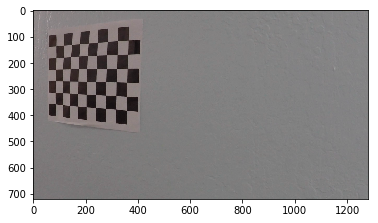

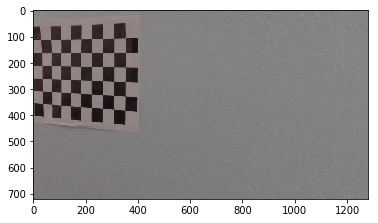

In [88]:
def GenCalibData(nx, ny):
    imgpoints = []
    objpoints = []
    images = []
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[:nx, :ny].T.reshape(-1, 2)
    for file in glob.glob("./camera_cal/calibration*.jpg"):
        print(file)
        img = cv2.imread(file)
        images.append(img)
        img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(img_grey, (nx, ny), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_grey.shape[::-1], None, None)
    
    for img in images:
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        plt.imshow(img)
        plt.show()
        plt.imshow(undist)
        plt.show()
    
    dict = {'mtx': mtx, 'dist': dist}
    output = open(calib_file_name, 'wb')
    pickle.dump(dict, output)
    output.close()

# Do camera calibration using given images
GenCalibData(nx, ny)

In [89]:
# Load mtx & dist from file
dist_pickle = pickle.load( open( calib_file_name, "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
print(mtx)
print(dist)

[[1.15777818e+03 0.00000000e+00 6.67113857e+02]
 [0.00000000e+00 1.15282217e+03 3.86124583e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[-0.24688507 -0.02373156 -0.00109831  0.00035107 -0.00259866]]


In [90]:
def DrawInfoOri(img_ori, left_fit, right_fit, M_inv):
    ploty = np.linspace(0, img_ori.shape[0]-1, img_ori.shape[0])
    img_poly = np.zeros_like(img_ori)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(img_poly, np.int_([pts]), (0,255, 0))
    
    cv2.polylines(img_poly, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(img_poly, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)

    img_size = (cols, rows)
    
    img_poly = cv2.warpPerspective(img_poly, M_inv, img_size, flags=cv2.INTER_LINEAR)
    
    output = cv2.addWeighted(img_ori, 1, img_poly, 0.5, 0)    
    
    return output

In [108]:
def CarDeviation(center_x, left_fit, right_fit):
    ploty = img.shape[0]
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
#     print(left_fitx, right_fitx)
    
    str_cd = ''
    if center_x >= left_fitx and center_x <= right_fitx:
        fit_meanx = float((left_fitx + right_fitx) * 0.5)
        if fit_meanx > center_x:
            str_cd = 'Car is ' +  str("{0:.6g}".format((fit_meanx - center_x) * xm_per_pix)) + ' m left to center'
        elif center_x > fit_meanx:
            str_cd = 'Car is ' +  str("{0:.6g}".format((center_x - fit_meanx) * xm_per_pix)) + ' m right to center'
        else:
            str_cd = 'Car is on the center!'
    else:
        str_cd = 'Car is unknown!!!'
#         print(str_cd)
        
    return str_cd

In [92]:
global left_history, right_history
left_history = []
right_history = []
def FindCurvature(left_fit, right_fit, ploty):
    # check history
    dev = 0
    for i in range(len(left_history)):
        dev = dev + np.sum((left_fit - left_history[i]) ** 2) ** 0.5 + np.sum((right_fit - right_history[i]) ** 2) ** 0.5
        
#     print(dev)
    if dev > 10.:
        left_fit = left_history[-1]
        right_fit = right_history[-1]
    left_history.append(left_fit)
    right_history.append(right_fit)
    if len(left_history) > 10:
        left_history.pop(0)
        right_history.pop(0)    
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#     print(left_curverad, right_curverad)

    # Fit new polynomials to x,y in world space
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    if show_debug_info:
        print(left_curverad, 'm', right_curverad, 'm')
    
    return left_curverad, right_curverad, left_fitx, right_fitx

In [93]:
def SWS(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
    return out_img, left_fit, right_fit

In [94]:
# Copied from lesson
window_width = 50 
window_height = 50 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def SlidingWindowSearch(warped):
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
        
    return output

In [95]:
def Sobel(img, thresh_min=25, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255. * abs_sobelx / np.max(abs_sobelx))

    # Threshold x gradient
#     thresh_min = 20
#     thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

#     plt.show()
#     plt.imshow(sxbinary)
    
    return sxbinary

In [96]:
# From Project 1
def LineFiltering(img_rgb, color_space):
    if color_space is "HSV":
        # convert image to hsv space
        img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
        (img_h, img_s, img_v) = cv2.split(img_hsv)
        dis_hsv = np.hstack((img_h, img_s, img_v))
        if show_debug_info:
            plt.show()
            plt.title("Images in HSV Color Space")
            plt.imshow(dis_hsv)

        # Filter out lanes in HSV color space
        # yellow lane
        y_lower = np.array([10, 70, 120])
        y_upper = np.array([50, 255, 255])
        img_y = cv2.inRange(img_hsv, y_lower, y_upper)
        if show_debug_info:
            plt.show()
            plt.title("Detection of Yellow Lane in HSV Color Space")
            plt.imshow(img_y)

        # white lane
        w_lower = np.array([0, 0, 200])
        w_upper = np.array([255, 70, 255])
        img_w = cv2.inRange(img_hsv, w_lower, w_upper)
        if show_debug_info:
            plt.show()
            plt.title("Detection of White Lane in HSV Color Space")
            plt.imshow(img_w)
        return cv2.bitwise_or(img_y, img_w)
    elif color_space is "RGB":
        img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        ret, img_gray_th = cv2.threshold(img_gray, 150, 255, cv2.THRESH_BINARY)
        if show_debug_info:
            plt.show()
            plt.title("Detection of Lanes in Gray Image")
            plt.imshow(img_gray_th)
        return img_gray_th
    elif color_space is "HSL":
        # convert image to hsl color space
        img_hls = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HLS)
        (img_h, img_l, img_s) = cv2.split(img_hls)
        dis_hsl = np.hstack((img_h, img_s, img_l))
        if show_debug_info:
            plt.show()
            plt.title("Images in HSL Color Space")
            plt.imshow(dis_hsl)

        # Filter out lanes in HSV color space
        # yellow lane
        y_lower = np.array([10, 100, 100])
        y_upper = np.array([70, 255, 255])
        img_y = cv2.inRange(img_hls, y_lower, y_upper)
        if show_debug_info:
            plt.show()
            plt.title("Detection of Yellow Lane in HSL Color Space")
            plt.imshow(img_y)

        # white lane
        w_lower = np.array([0, 200, 0])
        w_upper = np.array([255, 255, 255])
        img_w = cv2.inRange(img_hls, w_lower, w_upper)
        if show_debug_info:
            plt.show()
            plt.title("Detection of White Lane in HSL Color Space")
            plt.imshow(img_w)
        return cv2.bitwise_or(img_y, img_w)

def FindLineModel(x, y):
    mean_x = sum(x) / len(x)
    mean_y = sum(y) / len(y)
    k = sum((x_i - mean_x) * (y_i - mean_y) for x_i, y_i in zip(x, y)) / sum((x_i - mean_x)**2 for x_i in x)
    m = mean_y - k * mean_x
    
    return k, m
    
import sys
def DistanceFromLine(x, y, l_slope, l_intercept):
    dx = x - (y - l_intercept) / (l_slope + sys.float_info.epsilon)
    dy = y - (l_slope * x + l_intercept)
    
    return math.sqrt(dx**2 + dy**2)
    
def LineFitting(pts):
    n = 3
    num_iter = 20
    thresh = 30
    ratio = 0.6
    error = 1000000
    best_slope = 1
    best_intercept = 0    
    
    if pts.shape[0] < n:
        return FindLineModel(pts[:, 0], pts[:, 1])
    
    for i in range(num_iter):
        rnd_list = np.arange(pts.shape[0])
        np.random.shuffle(rnd_list)
        inlier_maybe = pts[rnd_list[:n]]
        inlier_also = []
        pt_others = pts[rnd_list[n:]]
        
        l_slope, l_intercept = FindLineModel(inlier_maybe[:, 0], inlier_maybe[:, 1])
        
        for pt in pt_others:
            if DistanceFromLine(pt[0], pt[1], l_slope, l_intercept) < thresh:
                inlier_also.append((pt[0], pt[1]))
                
        inlier_also = np.array(inlier_also)
        if inlier_also.shape[0] / pt_others.shape[0] > ratio:
            inlier = np.row_stack((inlier_maybe, inlier_also))
            l_s, l_i = FindLineModel(inlier[:, 0], inlier[:, 1])
            
            err_sum = 0
            for pt in inlier:
                err_sum += DistanceFromLine(pt[0], pt[1], l_s, l_i)
                
            if err_sum < error:
                error = err_sum
                best_slope = l_s
                best_intercept = l_i
        
    return best_slope, best_intercept
    
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [97]:
# Undistort & Transform image
def ImagePreprocess(img, nx, ny, mtx, dist):
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_undist_grey = cv2.cvtColor(img_undist, cv2.COLOR_BGR2GRAY)
    
    # ROI from Project 1 and adjust roi_y_min to make straight line straight 
    roi_y_min = rows * 0.62
    roi_x_min = cols * 0.45
    roi_x_max = cols * 0.55
    
    pt_src = np.array([
        [0,         rows],
        [roi_x_min, roi_y_min], 
        [roi_x_max, roi_y_min], 
        [cols,   rows]], np.float32)
    ratio_x = 0.35
    pt_dst = np.array([
        [ratio_x * cols,        1.0 * rows],
        [ratio_x * cols,        0.0 * rows],
        [(1. - ratio_x) * cols, 0.0 * rows],
        [(1. - ratio_x) * cols, 1.0 * rows]], np.float32)
    
    M = cv2.getPerspectiveTransform(pt_src, pt_dst)
    M_inv = cv2.getPerspectiveTransform(pt_dst, pt_src)
#     M = np.array(M, np.float64)
#     M_inv = np.array(M_inv, np.float64)
#     print(M)
#     print(M_inv)
    
    img_size = (cols, rows)
#     print(img_size)
    img_warp = cv2.warpPerspective(img_undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    return img_warp, M, M_inv


In [107]:
def Process(img):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
        
    # Use tuned ROI to filter unrelated stuffs in image under this camera
    # assume strong constraint: car is centered in the lane
    
    rows = img.shape[0]
    cols = img.shape[1]
    
    # image preprocessing (warping, color filter)
    top_down, M, M_inv = ImagePreprocess(img, nx, ny, mtx, dist)
    img_th = LineFiltering(top_down, "HSL")
    
    # Sobel
    img_sobel = np.array(Sobel(top_down, 20, 100), np.uint8)
    # Sobel + color 
    img_comb = cv2.bitwise_or(img_th, img_sobel * 255)
    
    # ROI to filter irrelovant info
    ratio_x = 0.25
    vertices = np.array([[
        (ratio_x * cols,        1.0 * rows),
        (ratio_x * cols,        0.0 * rows),
        ((1. - ratio_x) * cols, 0.0 * rows),
        ((1. - ratio_x) * cols, 1.0 * rows)]], np.int32)
    img_comb = region_of_interest(img_comb, vertices)
    test_images_fil.append(img_comb)
    
    # Sliding window to detect lane line
    ploty = np.linspace(0, img_comb.shape[0]-1, img_comb.shape[0])
    line_detect = SlidingWindowSearch(img_comb)
    out_img, left_fit, right_fit = SWS(img_comb)
    
    # Find curvatures
    left_curverad, right_curverad, left_fitx, right_fitx = FindCurvature(left_fit, right_fit, ploty)

    # check if car is on the center or not
    str_cardev = CarDeviation(img_comb.shape[1] * 0.5, left_fit, right_fit)
    
    img_ori = img.copy()
    img_draw = DrawInfoOri(img_ori, left_fit, right_fit, M_inv)
    
    # put text on image
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(img_draw, str_cardev, (10,100), font, 1, (255,255,255))
    str_l = 'Radius of Curvature of Left Lane is ' + "{0:.6g}".format(left_curverad) + ' m'
    cv2.putText(img_draw, str_l, (10,120), font, 1, (255,255,255))
    str_r = 'Radius of Curvature of Right Lane is ' + "{0:.6g}".format(right_curverad) + ' m'
    cv2.putText(img_draw, str_r, (10,140), font, 1, (255,255,255))
    
    if show_debug_info:
        f, axes = plt.subplots(2, 5, figsize=(24, 9))
        f.tight_layout()
        font_size = 20
        axes[0, 0].imshow(img)
        axes[0, 0].set_title('Original Image', fontsize=font_size)
        axes[0, 1].imshow(top_down)
        axes[0, 1].set_title('Transformed Image', fontsize=font_size)
        axes[0, 2].imshow(img_th)
        axes[0, 2].set_title("Detection of Lanes", fontsize=font_size)
        axes[0, 3].imshow(img_sobel)
        axes[0, 3].set_title("Sobel X", fontsize=font_size)
        axes[0, 4].imshow(img_comb)
        axes[0, 4].set_title("Combination", fontsize=font_size)
        axes[1, 0].imshow(out_img)
        axes[1, 0].plot(left_fitx, ploty, color='yellow')
        axes[1, 0].plot(right_fitx, ploty, color='yellow')
        axes[1, 1].imshow(line_detect)
        axes[1, 1].set_title("Detection", fontsize=font_size)
        axes[1, 2].imshow(img_draw)

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    return img_draw

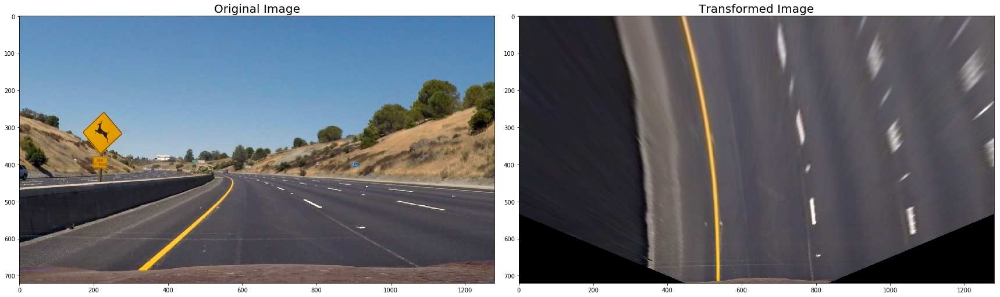

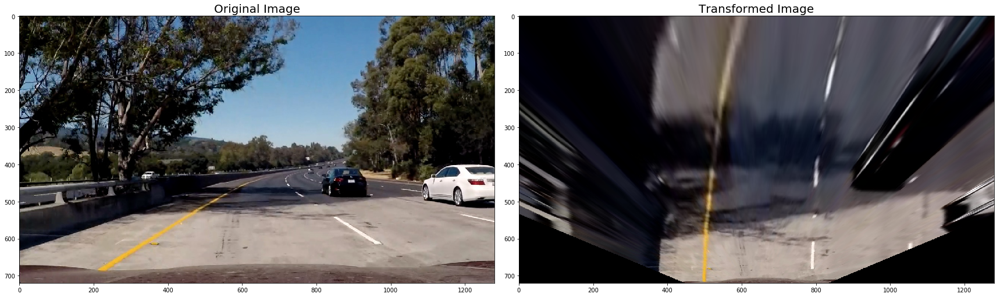

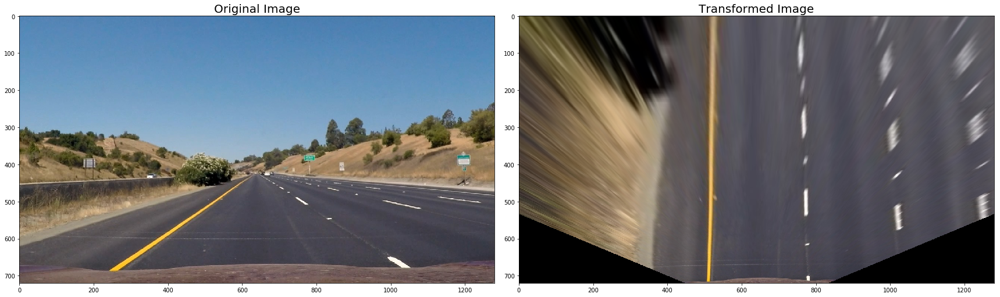

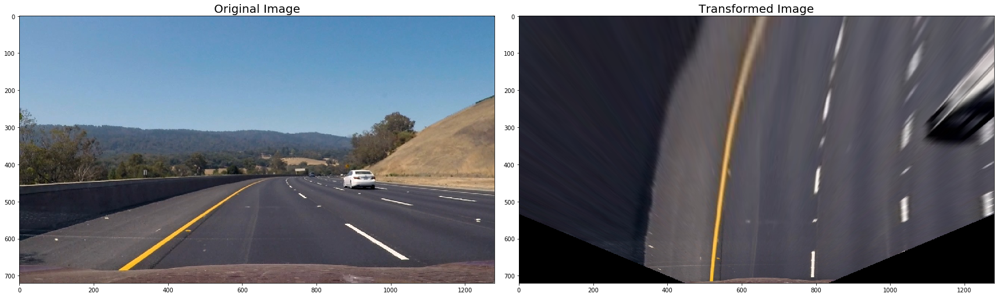

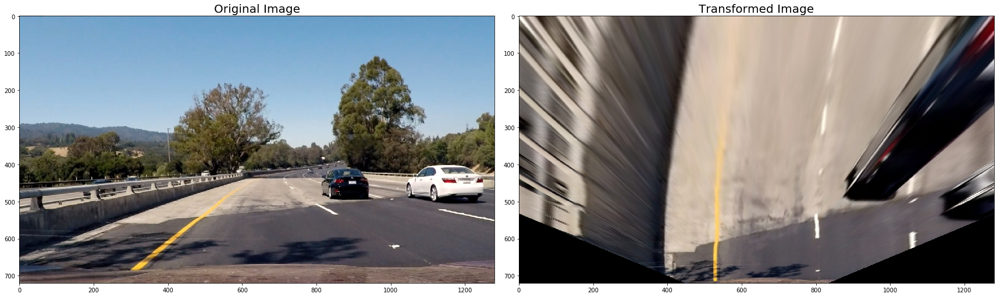

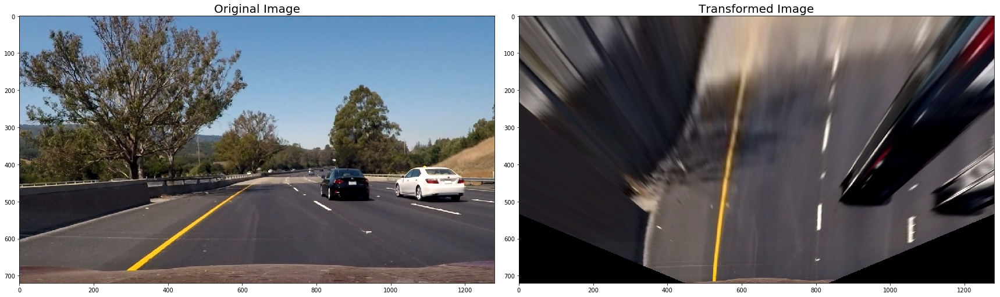

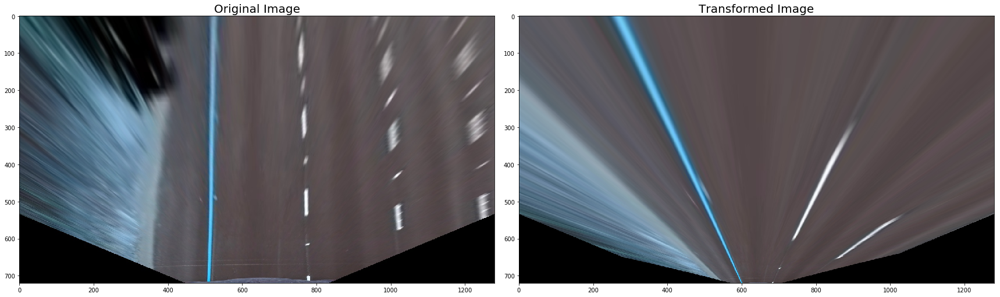

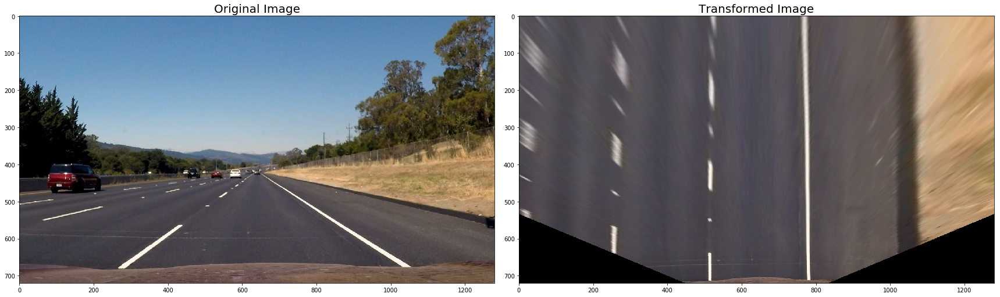

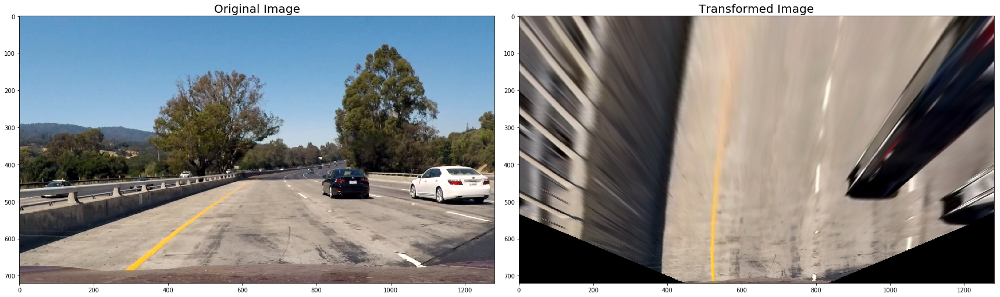

In [111]:
test_images = []
global rows, cols
for file in glob.glob("./test_images/*.jpg"):
    img = cv2.imread(file)
    rows = img.shape[0]
    cols = img.shape[1]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    test_images.append(img)
    
    top_down, M, M_inv = ImagePreprocess(img, nx, ny, mtx, dist)
    
    f, axes = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    font_size = 20
    axes[0].imshow(img)
    axes[0].set_title('Original Image', fontsize=font_size)
    axes[1].imshow(top_down)
    axes[1].set_title('Transformed Image', fontsize=font_size)
    
#     cv2.imwrite("./test_images/t.jpg", top_down)
#     break

test_images_fil = []

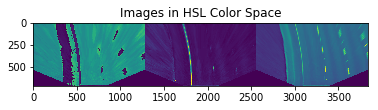

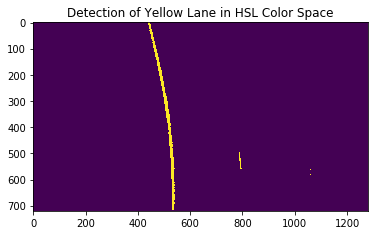

296.11847555455114 m 432.8986580857429 m


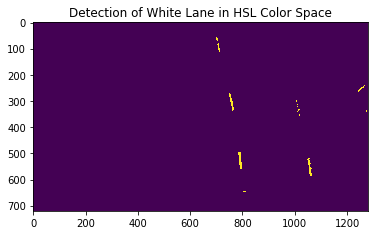

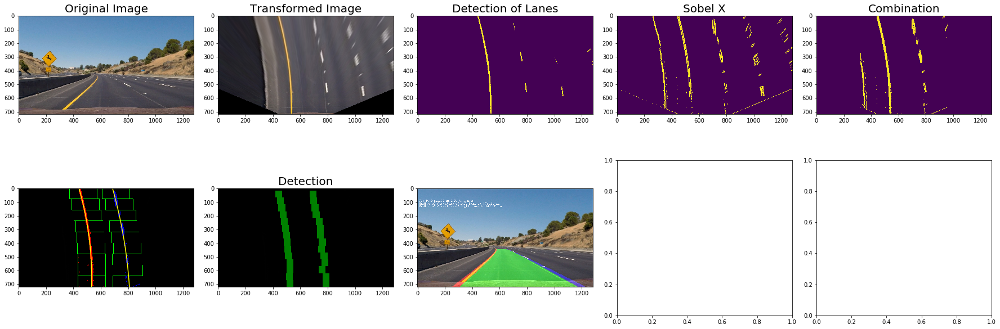

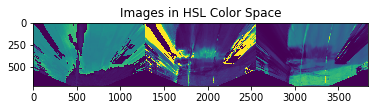

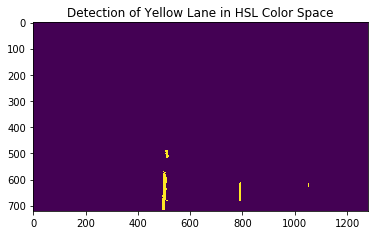

296.11847555455114 m 432.8986580857429 m


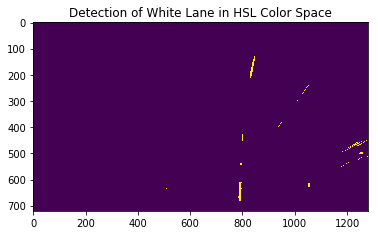

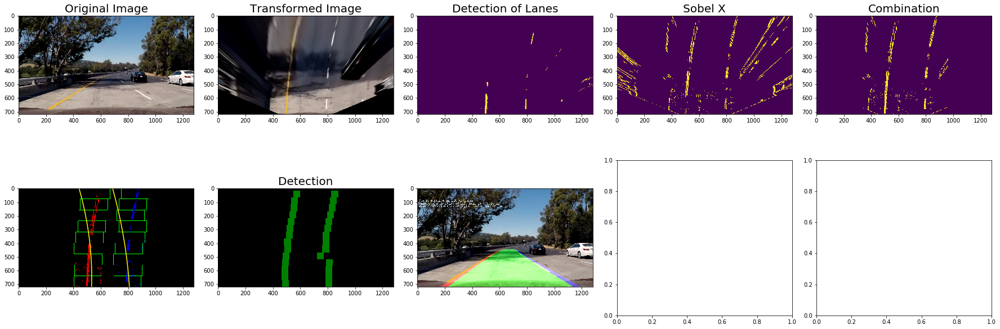

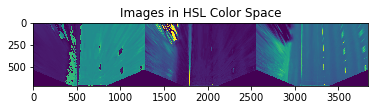

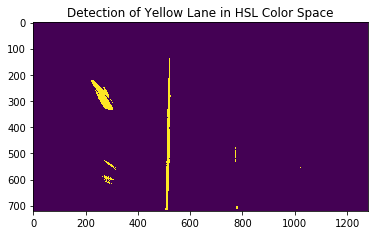

296.11847555455114 m 432.8986580857429 m


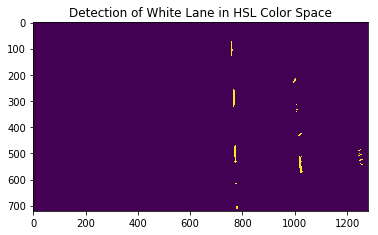

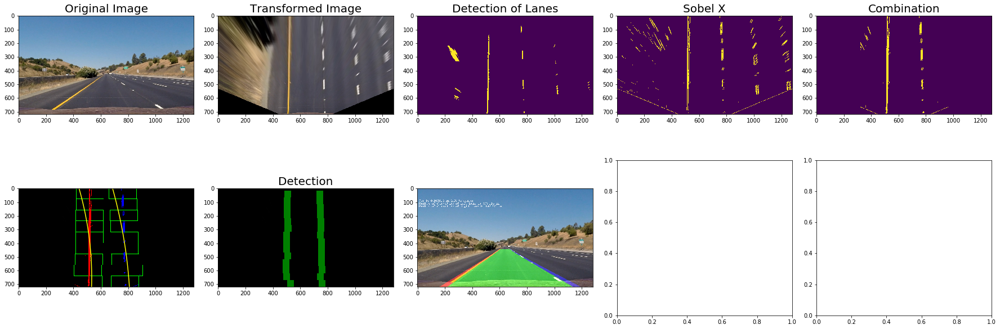

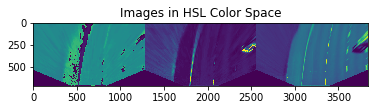

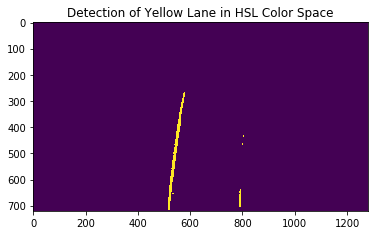

296.11847555455114 m 432.8986580857429 m


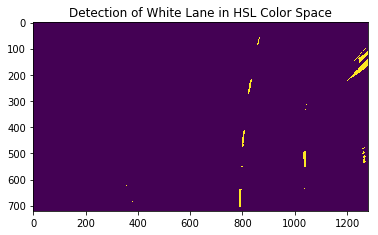

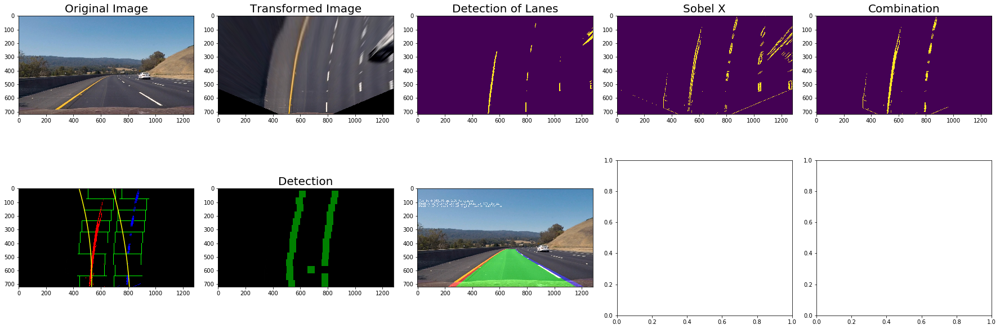

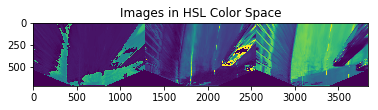

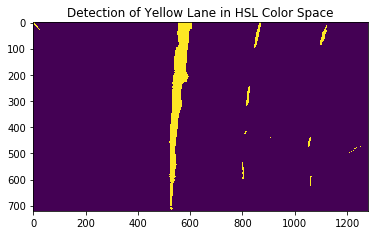

296.11847555455114 m 432.8986580857429 m


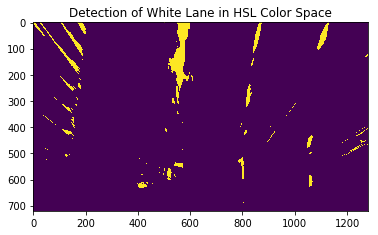

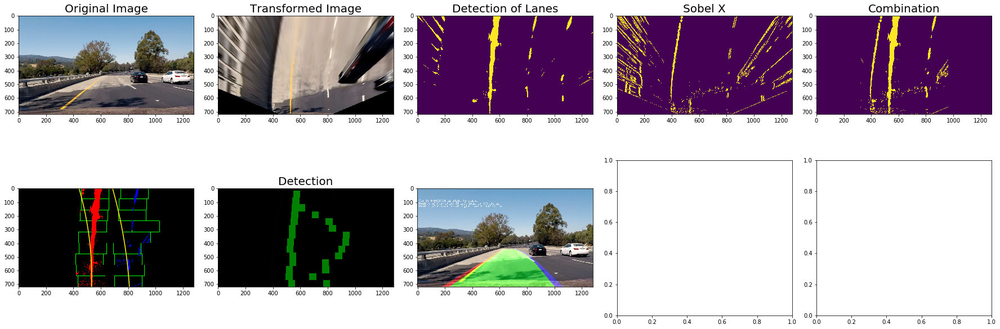

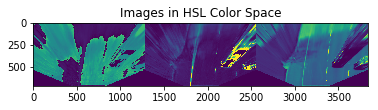

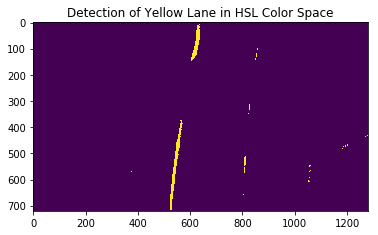

296.11847555455114 m 432.8986580857429 m


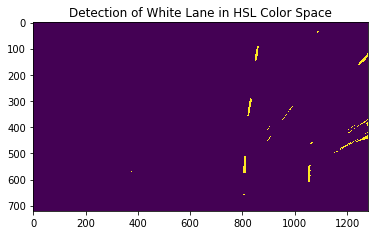

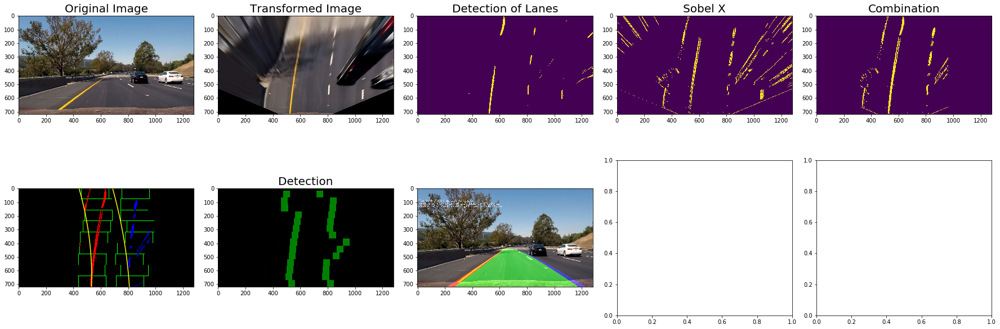

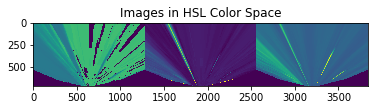

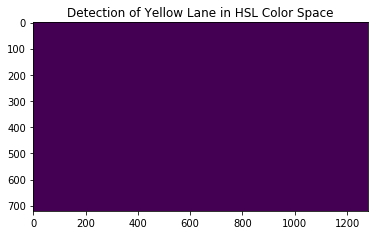

296.11847555455114 m 432.8986580857429 m


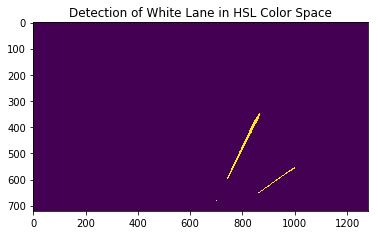

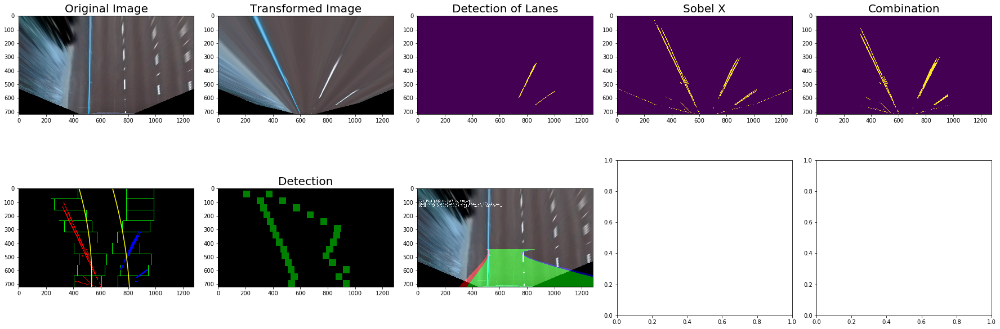

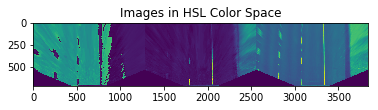

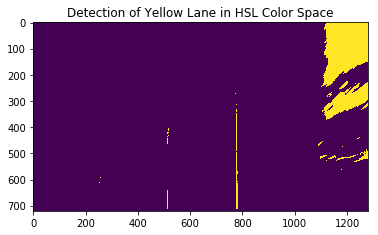

296.11847555455114 m 432.8986580857429 m


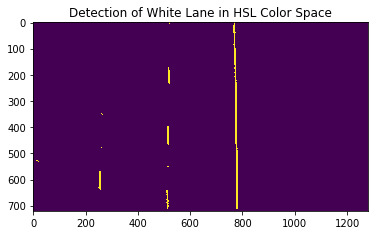

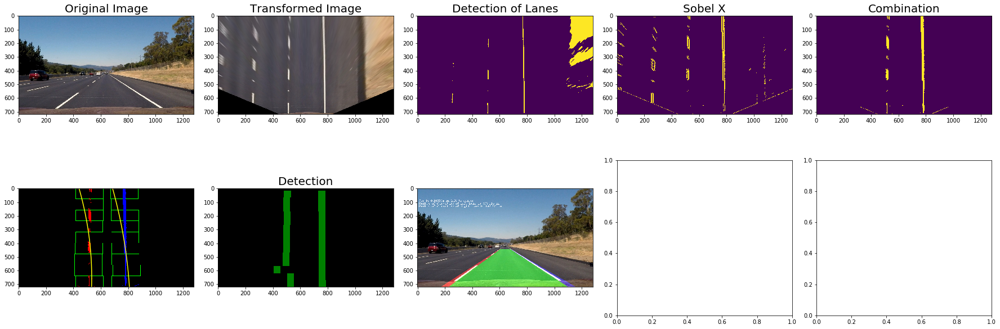

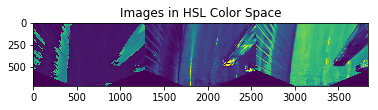

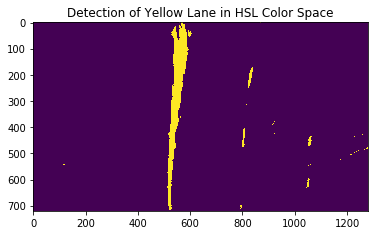

296.11847555455114 m 432.8986580857429 m


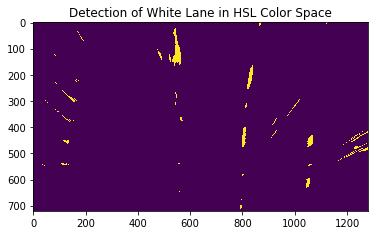

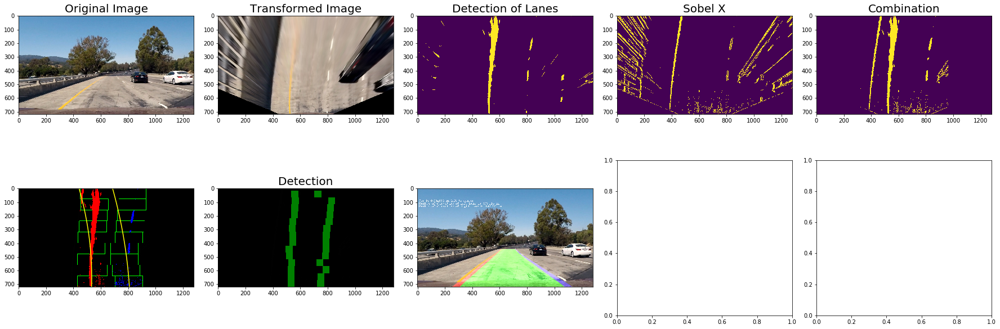

In [112]:
for img in test_images:
    Process(img)

---

In [113]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

show_debug_info = False

In [114]:
output_dir = 'test_videos_output/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [115]:
video_name = 'project_video.mp4'
white_output = output_dir + video_name
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("./" + video_name)
white_clip = clip1.fl_image(Process) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [02:28<00:00,  8.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 6min 2s, sys: 4.37 s, total: 6min 6s
Wall time: 2min 29s


In [116]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))